# Implementation of Wasserstein GAN on MNIST dataset

This notebook illustrates that the way to create simple WGAN architecture. Implementation is influenced from the assignments given in the [GAN specialization on Coursera](https://www.coursera.org/specializations/generative-adversarial-networks-gans?)



#1. Import modules

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28,28)):
  image_tensor=(image_tensor+1)/2 
  image_unflat = image_tensor.detach().cpu()
  image_grid= make_grid(image_unflat[:num_images],nrow=5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()

def make_grid_hook(): # to extract the gradients from the model (by applying model.apply(grad_hook))
  grads=[]
  def grad_hook(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
      grads.append(n.weight.grad)
  return grads, grad_hook

#2. Define generator, critic classes

In [ ]:
class Generator(nn.Module):
  def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
    super(Generator, self).__init__()
    self.z_dim = z_dim
    self.gen= nn.Sequential(
        self.make_gen_block(z_dim, hidden_dim*4),
        self.make_gen_block(hidden_dim*4,hidden_dim*2, kernel_size=4, stride=1),
        self.make_gen_block(hidden_dim*2,hidden_dim),
        self.make_gen_block(hidden_dim,im_chan, kernel_size=4, final_layer=True))

  def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
    if not final_layer:
      return nn.Sequential(
          nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
          nn.BatchNorm2d(output_channels),
          nn.ReLU(inplace=True) # CHECK THE IMPACT
      )
    else:
      return nn.Sequential(
          nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
          nn.Tanh())
      
  def forward(self, noise):
    x=noise.view(len(noise),self.z_dim, 1, 1)
    return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
  return torch.randn(n_samples, z_dim, device=device)
    

In [ ]:
class Critic(nn.Module):
  def __init__(self, im_chan=1, hidden_dim=64):
    super(Critic, self).__init__()
    self.crit= nn.Sequential(
        self.make_crit_block(im_chan, hidden_dim),
        self.make_crit_block(hidden_dim,hidden_dim*2),
        self.make_crit_block(hidden_dim*2,1, final_layer=True))
  def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
    if not final_layer:
      return nn.Sequential(
          nn.Conv2d(input_channels, output_channels, kernel_size, stride),
          nn.BatchNorm2d(output_channels),
          nn.LeakyReLU(0.2, inplace=True))
    else:
      return nn.Sequential(
          nn.Conv2d(input_channels, output_channels, kernel_size, stride))
  def forward(self, image): # returns 1D TENSOR -> representing real/ fake
    crit_pred=self.crit(image)
    return crit_pred.view(len(crit_pred), -1)


#3. Initialize hyper parameters

In [ ]:
n_epochs=100
z_dim= 64
display_step=128
batch_size=128
lr= 0.0002
beta_1= 0.5
beta_2= 0.999
c_lambda=10
crit_repeats= 5
device= 'cuda' if torch.cuda.is_available() else "cpu"

#4. Get datasets

In [ ]:
transform=transforms.Compose([
                              transforms.ToTensor(),
                              transforms.Normalize((0.5,),(0.5,))])
dataloader= DataLoader(
    MNIST('.', download=True, transform= transform),
    batch_size= batch_size,
    shuffle=True)

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


# 5. Initialize models

In [ ]:
gen=Generator(z_dim).to(device)
crit = Critic().to(device)

from torchsummary import summary
print('Critic :')
summary(crit,(1,28,28))
print('Generator :')
summary(gen,(z_dim,1,1))

Critic :
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 13, 13]           1,088
       BatchNorm2d-2           [-1, 64, 13, 13]             128
         LeakyReLU-3           [-1, 64, 13, 13]               0
            Conv2d-4            [-1, 128, 5, 5]         131,200
       BatchNorm2d-5            [-1, 128, 5, 5]             256
         LeakyReLU-6            [-1, 128, 5, 5]               0
            Conv2d-7              [-1, 1, 1, 1]           2,049
Total params: 134,721
Trainable params: 134,721
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.32
Params size (MB): 0.51
Estimated Total Size (MB): 0.84
----------------------------------------------------------------
Generator :
----------------------------------------------------------------
        Layer (type)

In [ ]:
gen=Generator(z_dim).to(device)
gen_opt=torch.optim.Adam(gen.parameters(), lr= lr, betas= (beta_1, beta_2))
crit = Critic().to(device)
crit_opt=torch.optim.Adam(crit.parameters(), lr= lr, betas=(beta_1, beta_2))

def weights_init(m):
  if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
    torch.nn.init.normal_(m.weight, 0.0, 0.02)
  if isinstance(m, nn.BatchNorm2d):
    torch.nn.init.normal_(m.weight, 0.0, 0.02)
    torch.nn.init.constant_(m.bias, 0)

gen=gen.apply(weights_init)
crit=crit.apply(weights_init)

# 6. Gradient penalty

1. Compute the gradients wrt images
2. Compute the gradient penalty given the gradient

In [ ]:
# 1. Compute the gradients: 

# Steps:
'''
1. Create mixed images -> by weighting fake and real image using epsilon and then adding them
2. Then get the critic outputs on the image
3. Compute the gradient vectors of the critic function/ model of scores vectors (wrt those mixed images)
'''

def get_gradient(crit, real, fake, epsilon): 
  # this returns -> (batch_size, 1, 28, 28) shape tensor which carries the sums of gradients of the path input_pixel -> output_vector
  
  mixed_images= real * epsilon + fake*(1-epsilon)
  mixed_scores= crit(mixed_images)
  gradient= torch.autograd.grad(
      outputs = mixed_scores, 
      inputs = mixed_images,
      grad_outputs=torch.ones_like(mixed_scores), # WHY ??? DID NOT UNDERSTOOD
      create_graph=True, # graph of derivatives constructed which allows to compute higher order derivative products,
      retain_graph=True, # graph used to compute the grad WILL NOT be freed/ erased
      )[0]
  return gradient



In [ ]:
#2. Compute the gradient penalty

#Steps
'''
1. calculate the magnitude/ norm of each image's gradient
2. calculate the penalty by squaring the distance between each magnitude and teh ideal norm of 1 -> then take the mean
'''

def gradient_penalty(gradient):
  gradient=gradient.view(len(gradient), -1) # flatten the gradient tensors
  gradient_norm=gradient.norm(2, dim=1) # get magnitude/ L2 norm for each input image
  penalty =  torch.nn.MSELoss()(gradient_norm, torch.ones_like(gradient_norm))
  return penalty
  

#7. Losses

1. For generator -> loss is calculated by maximizing the crtics prediction on generated fake images

2. For critic -> loss is calcualted by maximizing the distance between critics predictions on real images and fake images while adding a gradient penalty 

(Note that -> gradient penalty is needed only for the **critic** !!!)

In [ ]:
def get_gen_loss(crit_fake_pred):
  gen_loss=  -torch.mean(crit_fake_pred) 
  return gen_loss

def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda): 
  #here gp: unweighted gradient penalty, c_lambda: weight for grad penalty

  crit_loss=  torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
  # CHECK -> IN THE LECTURES -> SUBSTRACTION IS DONE OTHER WAY AROUND

  return crit_loss

#8. Model training

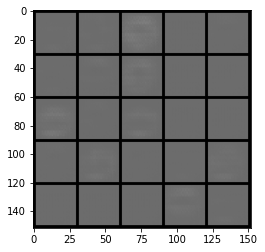

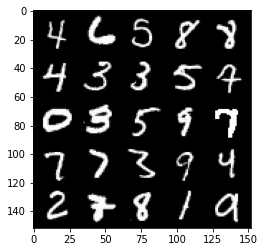

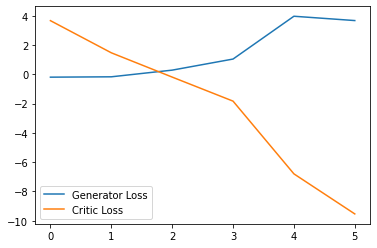

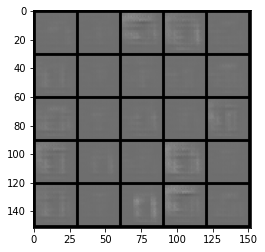

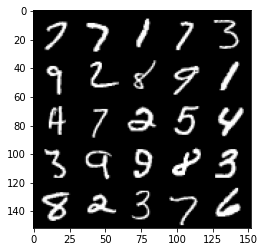

...

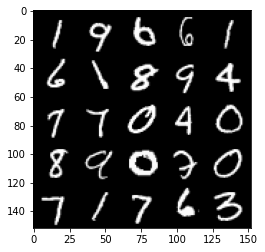

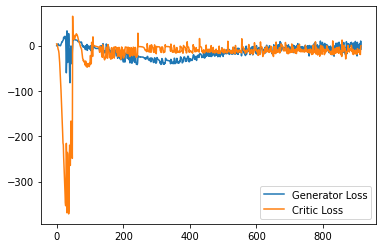

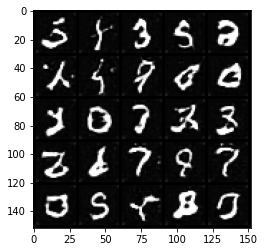

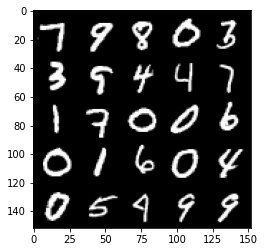

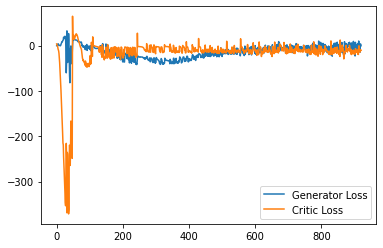

Buffered data was truncated after reaching the output size limit.

In [ ]:
import matplotlib

cur_step=0
generator_losses=[]
critic_losses=[]

for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_batch_size=len(real)
    real=real.to(device)

    mean_iteration_critic_loss=0

    # critic
    for _ in range(crit_repeats):
      crit_opt.zero_grad()
      fake_noise= get_noise(cur_batch_size, z_dim, device=device)
      fake= gen(fake_noise)
      crit_fake_pred= crit(fake.detach())
      crit_real_pred= crit(real)

      epsilon=torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
      gradient= get_gradient(crit, real, fake.detach(), epsilon)
      gp= gradient_penalty(gradient)
      crit_loss= get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

      mean_iteration_critic_loss += crit_loss.item() / crit_repeats
      crit_loss.backward(retain_graph=True)
      crit_opt.step()
    critic_losses += [mean_iteration_critic_loss]

    ## generator
    gen_opt.zero_grad()
    fake_noise_2= get_noise(cur_batch_size, z_dim, device=device)
    fake_2= gen(fake_noise_2)
    crit_fake_pred = crit(fake_2)

    gen_loss= get_gen_loss(crit_fake_pred)
    gen_loss.backward()

    gen_opt.step()
    generator_losses+= [gen_loss.item()]

    if cur_step % display_step==0 and cur_step>0 :
      show_tensor_images(fake)
      show_tensor_images(real)

      step_bins=20
      num_examples= (len(generator_losses)// step_bins)* step_bins

      ##### COPIED AND PASTED
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
          label="Generator Loss"
      )
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
          label="Critic Loss"
      )
      plt.legend()
      plt.show()
      #####
    cur_step+=1
    

# 9. Conclusions


1. Training is much slower due to calculation of gradient penalty

2. **Critic** will be updated multiple times -> to avoid the overpowering of generator
  
  * Note that, previous cases, actually we have done this other way around !!!

3. WGAN-GP -> is not necessary meant to improve overall performance of a GAN but **increases the stability and avoid mode collapse**

  * You should be able to run more epochs without collapsing (CHECK?? - Is DCGANs always collapsing ?**bold text**)